# IBM Clustering Final Project

## Data

The data used here is data represents the sleeping habits of 452 individuals and will be used to cluster them into different types of sleepers. The data set was taken from https://www.kaggle.com/datasets/equilibriumm/sleep-efficiency.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [2]:
# Surpress warnings:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

# Define random state
rs = 123

In [3]:
raw_data = pd.read_csv('./data/marketing_campaign.csv', sep='\t')
raw_data.head(5)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


Check the data for null values

In [4]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

Remove the entries with null values

In [6]:
raw_data = raw_data[~raw_data.isnull().any(axis=1)]
data = raw_data.copy()
data = data.drop(columns=['ID', 'Z_CostContact', 'Z_Revenue'])
data.shape

(2216, 26)

Find categorical data which needs to be encoded

In [7]:
categorical_col = data.columns[data.dtypes==object]
categorical_col

Index(['Education', 'Marital_Status', 'Dt_Customer'], dtype='object')

In [8]:
uniques = {"Feature": [],
           "No. Uniques": [],
           "Values": []}
for col in categorical_col:
    uniques['Feature'].append(col)
    vals = data[col].unique()
    uniques['No. Uniques'].append(len(vals))
    uniques['Values'].append(vals)
    
uniques = pd.DataFrame(uniques)
uniques

,Feature,No. Uniques,Values
0,Education,5,"[Graduation, PhD, Master, Basic, 2n Cycle]"
1,Marital_Status,8,"[Single, Together, Married, Divorced, Widow, A..."
2,Dt_Customer,662,"[04-09-2012, 08-03-2014, 21-08-2013, 10-02-201..."


In [124]:
raw_data.Marital_Status.value_counts()

Married     857
Together    573
Single      471
Divorced    232
Widow        76
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64

Encode `Education` and `Marital_Status`

In [9]:
from sklearn.preprocessing import OrdinalEncoder

In [10]:
encoder = OrdinalEncoder(categories=[['Basic', 'Graduation', '2n Cycle', 'Master', 'PhD']])
data['Education'] = encoder.fit_transform(data['Education'].values.reshape(-1,1))
encoder = OrdinalEncoder()
data['Marital_Status'] = encoder.fit_transform(data['Marital_Status'].values.reshape(-1,1))

In [11]:
data.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,1957,1.0,4.0,58138.0,0,0,04-09-2012,58,635,88,...,10,4,7,0,0,0,0,0,0,1
1,1954,1.0,4.0,46344.0,1,1,08-03-2014,38,11,1,...,1,2,5,0,0,0,0,0,0,0
2,1965,1.0,5.0,71613.0,0,0,21-08-2013,26,426,49,...,2,10,4,0,0,0,0,0,0,0
3,1984,1.0,5.0,26646.0,1,0,10-02-2014,26,11,4,...,0,4,6,0,0,0,0,0,0,0
4,1981,4.0,3.0,58293.0,1,0,19-01-2014,94,173,43,...,3,6,5,0,0,0,0,0,0,0


Calculate the number of days since becoming a customer relative to the earliest customer

In [12]:
data['Dt_Customer'] = pd.to_datetime(data['Dt_Customer'])
data['Dt_Customer'] -= data['Dt_Customer'].min()
data['Dt_Customer'] = list(map(lambda x: x.days, data['Dt_Customer']))
data['Dt_Customer']

0         92
1        938
2        591
3        998
4        742
        ... 
2235     522
2236    1002
2237     748
2238     747
2239     281
Name: Dt_Customer, Length: 2216, dtype: int64

Check the distribution of the numerical data

In [13]:
data.describe()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
count,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,...,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000
mean,1968.820397,2.046480,3.726083,52247.251354,0.441787,0.505415,550.993682,49.012635,305.091606,26.356047,...,2.671029,5.800993,5.319043,0.073556,0.074007,0.073105,0.064079,0.013538,0.009477,0.150271
std,11.985554,1.277733,1.077731,25173.076661,0.536896,0.544181,232.469034,28.948352,337.327920,39.793917,...,2.926734,3.250785,2.425359,0.261106,0.261842,0.260367,0.244950,0.115588,0.096907,0.357417
min,1893.000000,0.000000,0.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1959.000000,1.000000,3.000000,35303.000000,0.000000,0.000000,377.000000,24.000000,24.000000,2.000000,...,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1970.000000,1.000000,4.000000,51381.500000,0.000000,0.000000,550.000000,49.000000,174.500000,8.000000,...,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1977.000000,3.000000,5.000000,68522.000000,1.000000,1.000000,723.000000,74.000000,505.000000,33.000000,...,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1996.000000,4.000000,7.000000,666666.000000,2.000000,2.000000,1063.000000,99.000000,1493.000000,199.000000,...,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [14]:
data.skew()

Year_Birth             -0.353661
Education               0.468014
Marital_Status          0.170633
Income                  6.763487
Kidhome                 0.635610
Teenhome                0.407553
Dt_Customer            -0.006096
Recency                 0.001648
MntWines                1.170720
MntFruits               2.101658
MntMeatProducts         2.025577
MntFishProducts         1.916369
MntSweetProducts        2.103328
MntGoldProds            1.839231
NumDealsPurchases       2.415272
NumWebPurchases         1.197037
NumCatalogPurchases     1.881075
NumStorePurchases       0.701826
NumWebVisitsMonth       0.218043
AcceptedCmp3            3.269397
AcceptedCmp4            3.256758
AcceptedCmp5            3.282143
AcceptedCmp1            3.562482
AcceptedCmp2            8.424753
Complain               10.132737
Response                1.958748
dtype: float64

In [15]:
skew_columns = list(data.skew()[data.skew().abs() > 0.7].index)
skew_columns

['Income',
 'MntWines',
 'MntFruits',
 'MntMeatProducts',
 'MntFishProducts',
 'MntSweetProducts',
 'MntGoldProds',
 'NumDealsPurchases',
 'NumWebPurchases',
 'NumCatalogPurchases',
 'NumStorePurchases',
 'AcceptedCmp3',
 'AcceptedCmp4',
 'AcceptedCmp5',
 'AcceptedCmp1',
 'AcceptedCmp2',
 'Complain',
 'Response']

In [16]:
for col in skew_columns:
    data[col] = np.log1p(data[col])

In [17]:
data.skew()

Year_Birth             -0.353661
Education               0.468014
Marital_Status          0.170633
Income                 -1.167952
Kidhome                 0.635610
Teenhome                0.407553
Dt_Customer            -0.006096
Recency                 0.001648
MntWines               -0.551928
MntFruits               0.078947
MntMeatProducts        -0.089557
MntFishProducts        -0.054273
MntSweetProducts        0.082380
MntGoldProds           -0.348304
NumDealsPurchases       0.668561
NumWebPurchases        -0.278853
NumCatalogPurchases     0.128468
NumStorePurchases      -0.128261
NumWebVisitsMonth       0.218043
AcceptedCmp3            3.269397
AcceptedCmp4            3.256758
AcceptedCmp5            3.282143
AcceptedCmp1            3.562482
AcceptedCmp2            8.424753
Complain               10.132737
Response                1.958748
dtype: float64

Scale numerical features

In [18]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
scaler = StandardScaler()

In [19]:
for col in data.columns:
    data[col] = scaler.fit_transform(data[col].values.reshape(-1,1))
data.describe()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
count,2.216000e+03,2.216000e+03,2.216000e+03,2.216000e+03,2.216000e+03,2.216000e+03,2.216000e+03,2.216000e+03,2.216000e+03,2.216000e+03,...,2.216000e+03,2.216000e+03,2.216000e+03,2.216000e+03,2.216000e+03,2.216000e+03,2.216000e+03,2216.000000,2.216000e+03,2.216000e+03
mean,6.450516e-15,-1.378761e-16,-9.779582e-17,-3.881372e-15,-1.122247e-16,4.168346e-17,-1.651306e-16,-2.404815e-18,2.228462e-16,-1.314632e-16,...,-2.212430e-16,9.539100e-17,-5.771557e-17,4.328667e-17,-2.404815e-18,4.809630e-17,-8.016051e-18,0.000000,1.523050e-17,4.649309e-17
std,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,...,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226,1.000226e+00,1.000226e+00
min,-6.327410e+00,-1.602011e+00,-3.458120e+00,-6.520025e+00,-8.230393e-01,-9.289722e-01,-2.370716e+00,-1.693488e+00,-2.591088e+00,-1.429313e+00,...,-1.308452e+00,-3.717059e+00,-2.193591e+00,-2.817730e-01,-2.827048e-01,-2.808389e-01,-2.616615e-01,-0.117148,-9.781206e-02,-4.205300e-01
25%,-8.195377e-01,-8.191980e-01,-6.738665e-01,-5.577553e-01,-8.230393e-01,-9.289722e-01,-7.486285e-01,-8.642385e-01,-8.080246e-01,-7.293130e-01,...,-1.308452e+00,-8.586966e-01,-9.563810e-01,-2.817730e-01,-2.827048e-01,-2.808389e-01,-2.616615e-01,-0.117148,-9.781206e-02,-4.205300e-01
50%,9.844093e-02,-8.191980e-01,2.542181e-01,1.843443e-01,-8.230393e-01,-9.289722e-01,-4.275436e-03,-4.365786e-04,2.714709e-01,-2.931304e-02,...,1.166861e-01,-2.267915e-02,2.808287e-01,-2.817730e-01,-2.827048e-01,-2.808389e-01,-2.616615e-01,-0.117148,-9.781206e-02,-4.205300e-01
75%,6.826092e-01,7.464275e-01,1.182303e+00,7.535643e-01,1.039938e+00,9.090657e-01,7.400777e-01,8.633654e-01,8.580387e-01,8.175692e-01,...,7.793374e-01,8.133383e-01,6.932320e-01,-2.817730e-01,-2.827048e-01,-2.808389e-01,-2.616615e-01,-0.117148,-9.781206e-02,-4.205300e-01
max,2.268209e+00,1.529240e+00,3.038472e+00,5.252255e+00,2.902916e+00,2.747104e+00,2.202968e+00,1.727167e+00,1.457776e+00,1.946602e+00,...,3.059659e+00,1.724341e+00,6.054474e+00,3.548956e+00,3.537258e+00,3.560760e+00,3.821732e+00,8.536197,1.022369e+01,2.377952e+00


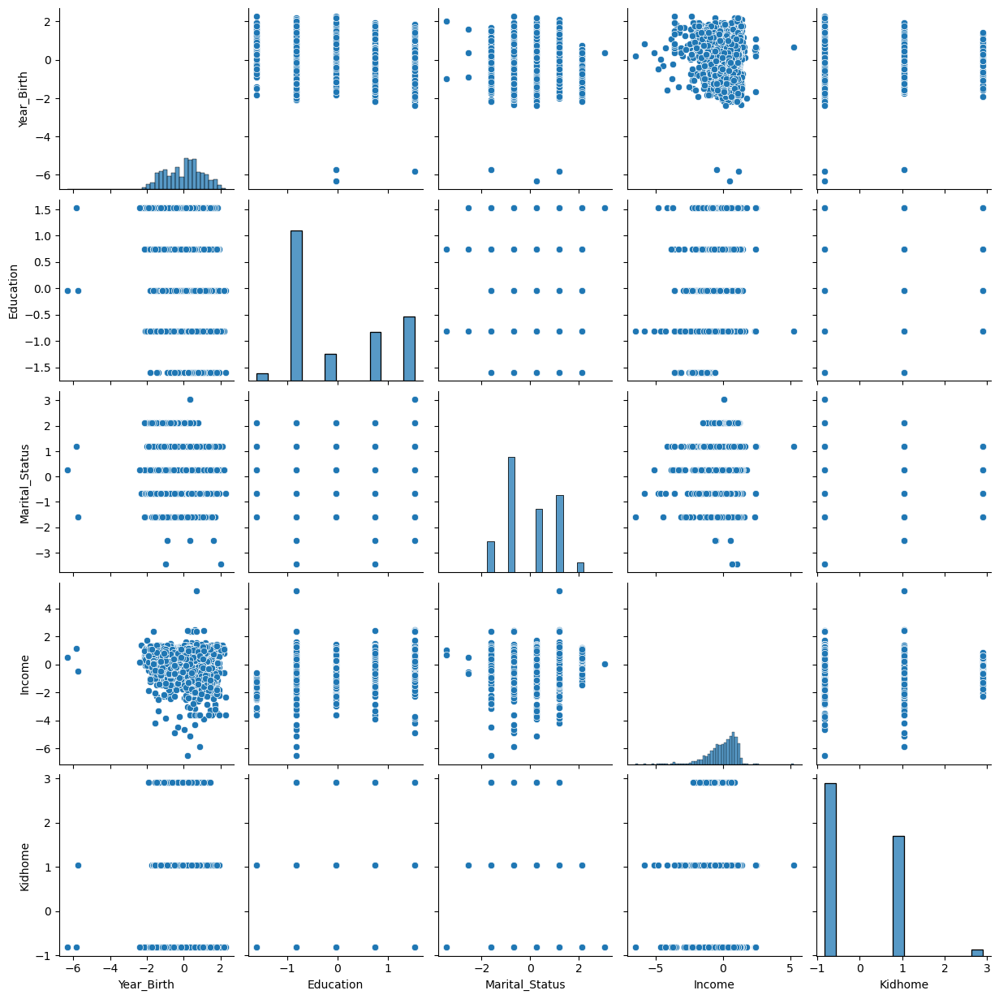

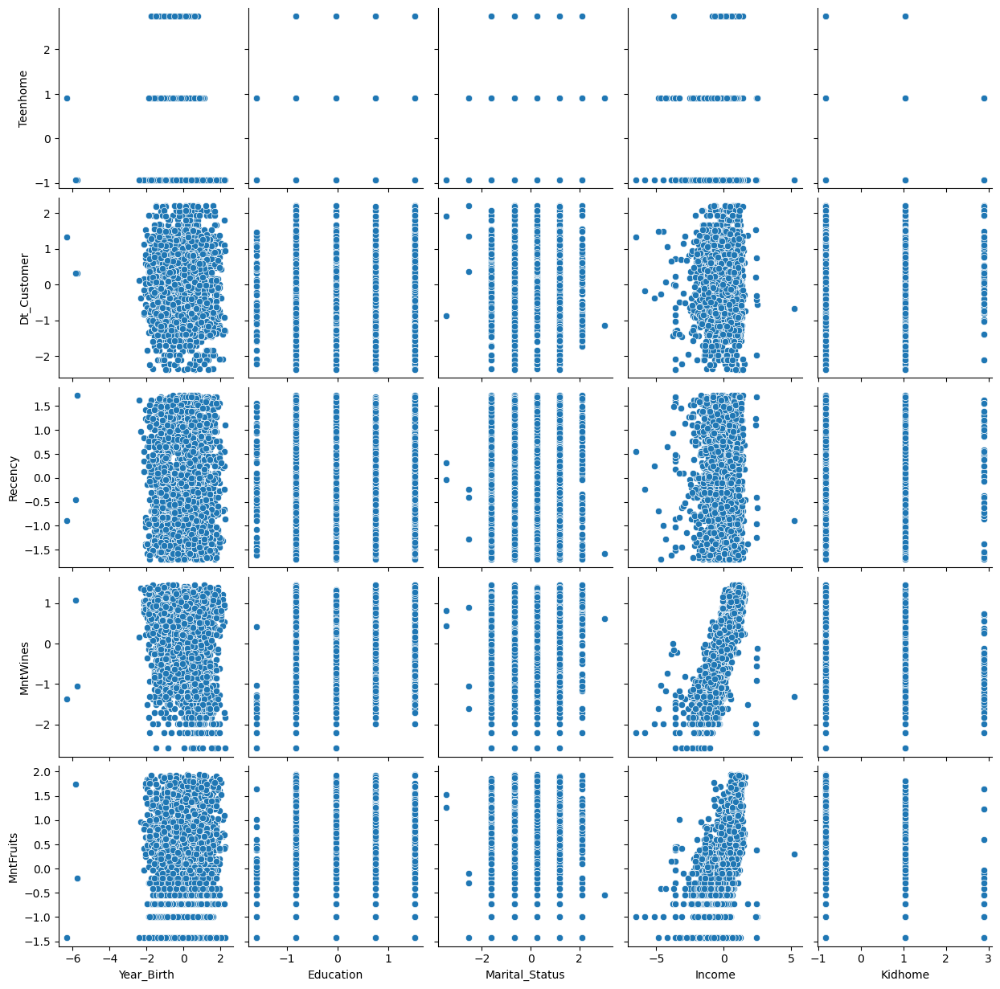

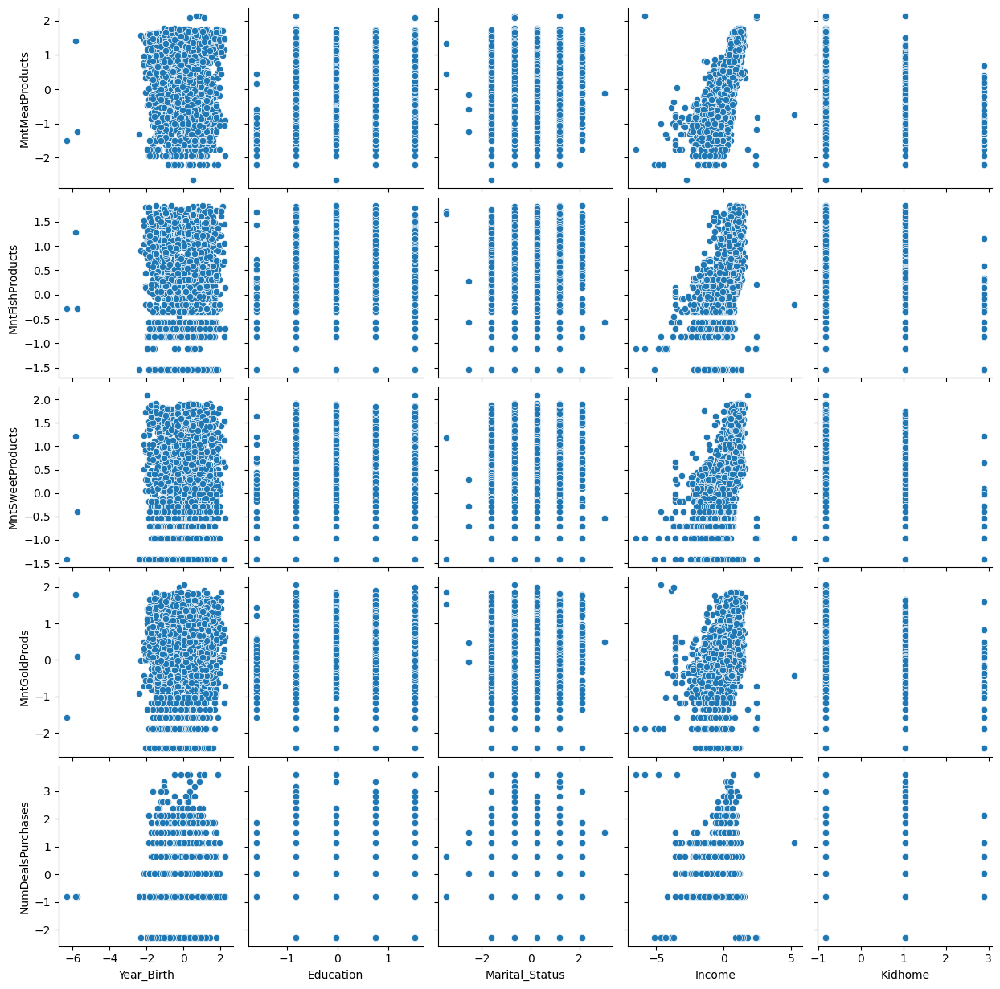

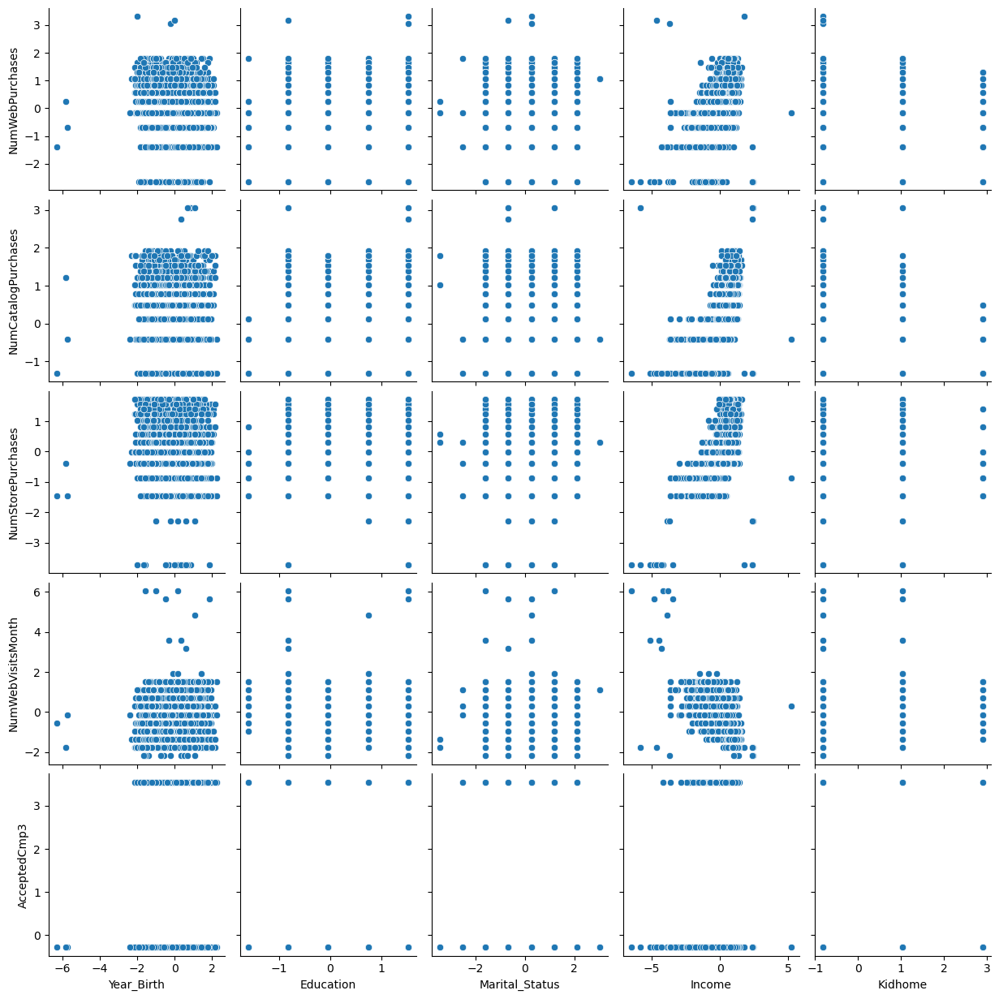

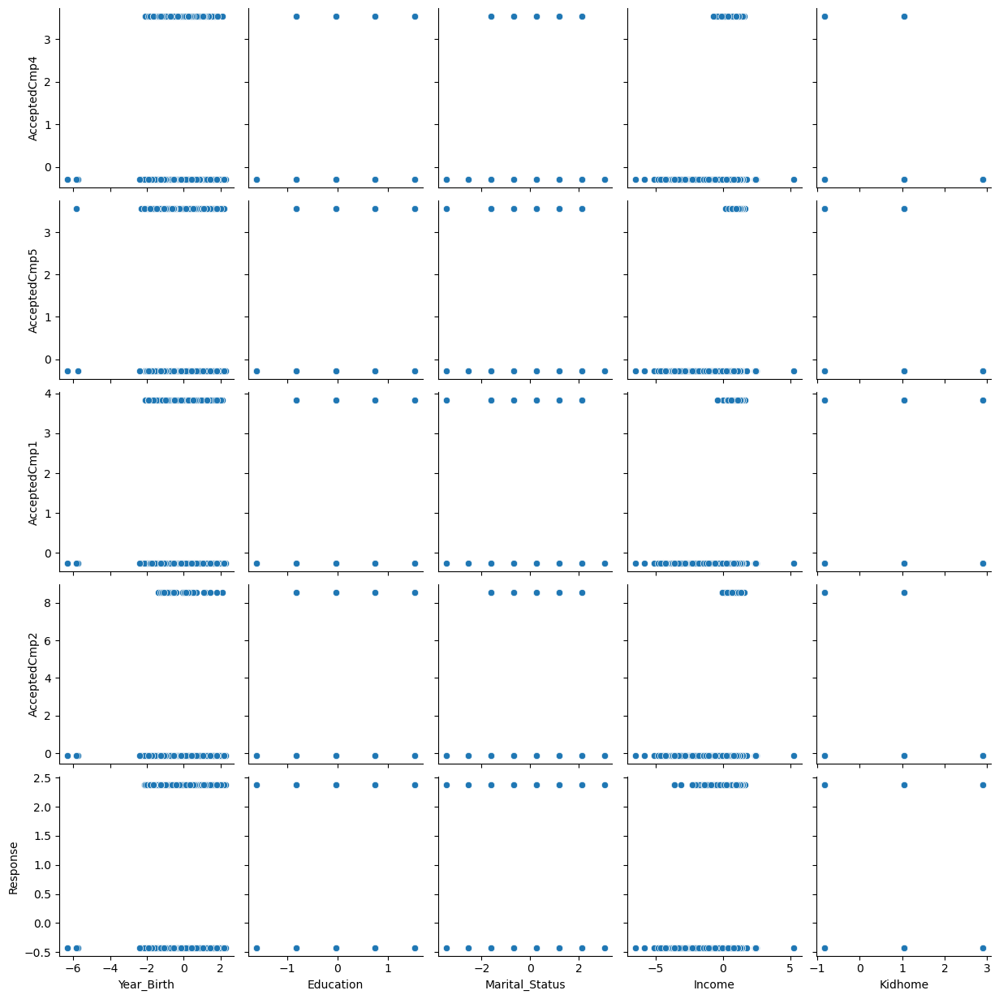

...

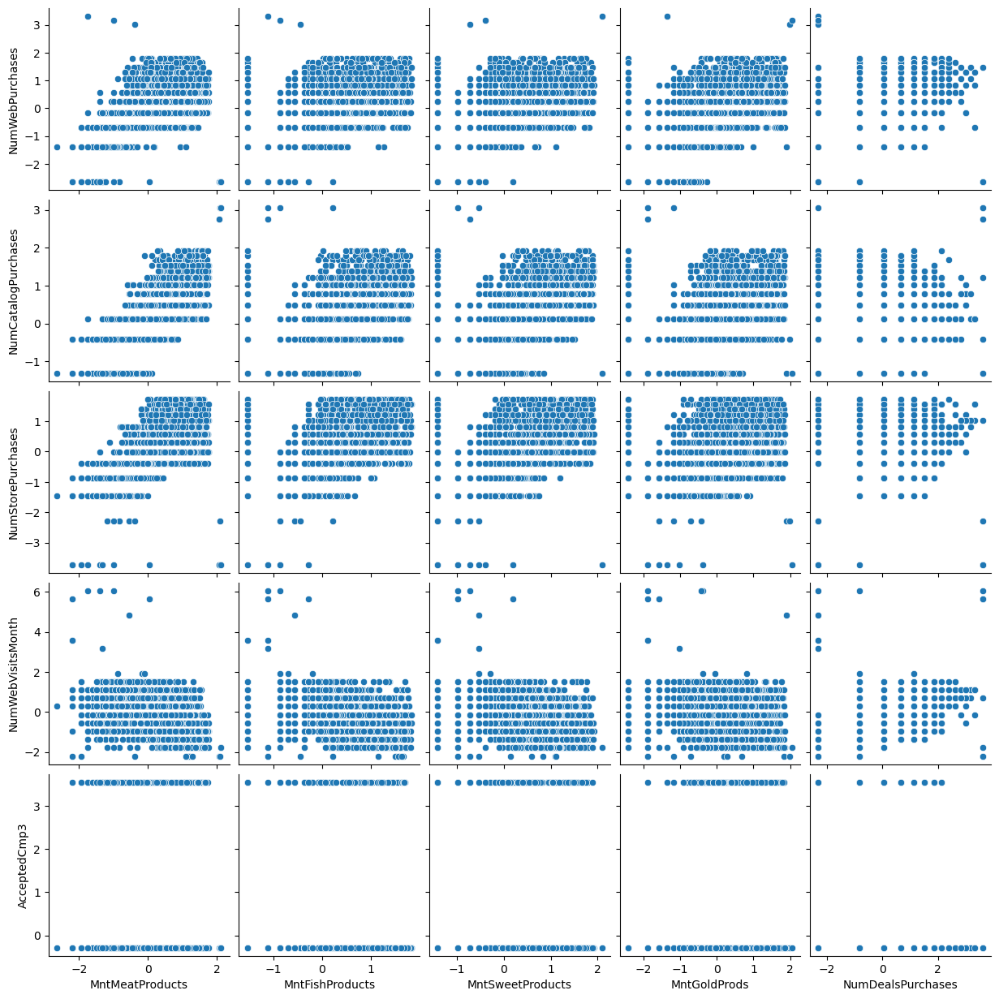

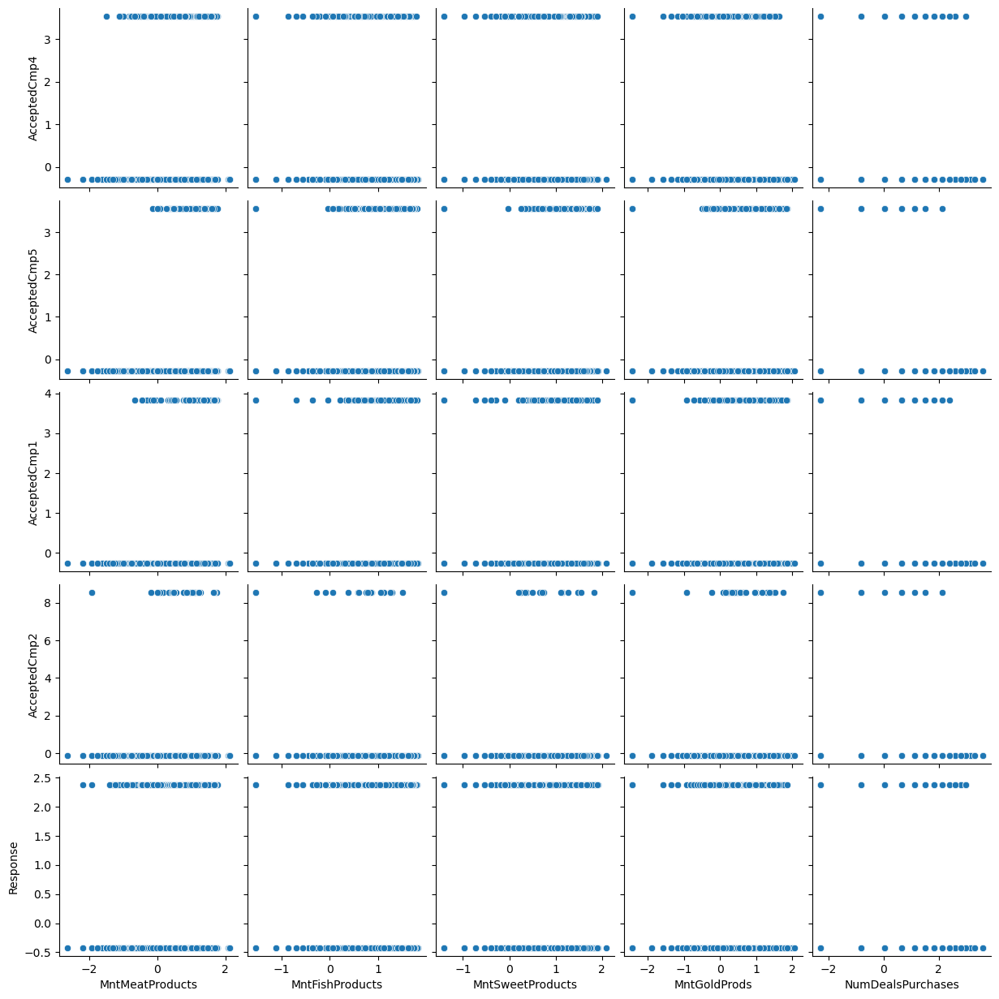

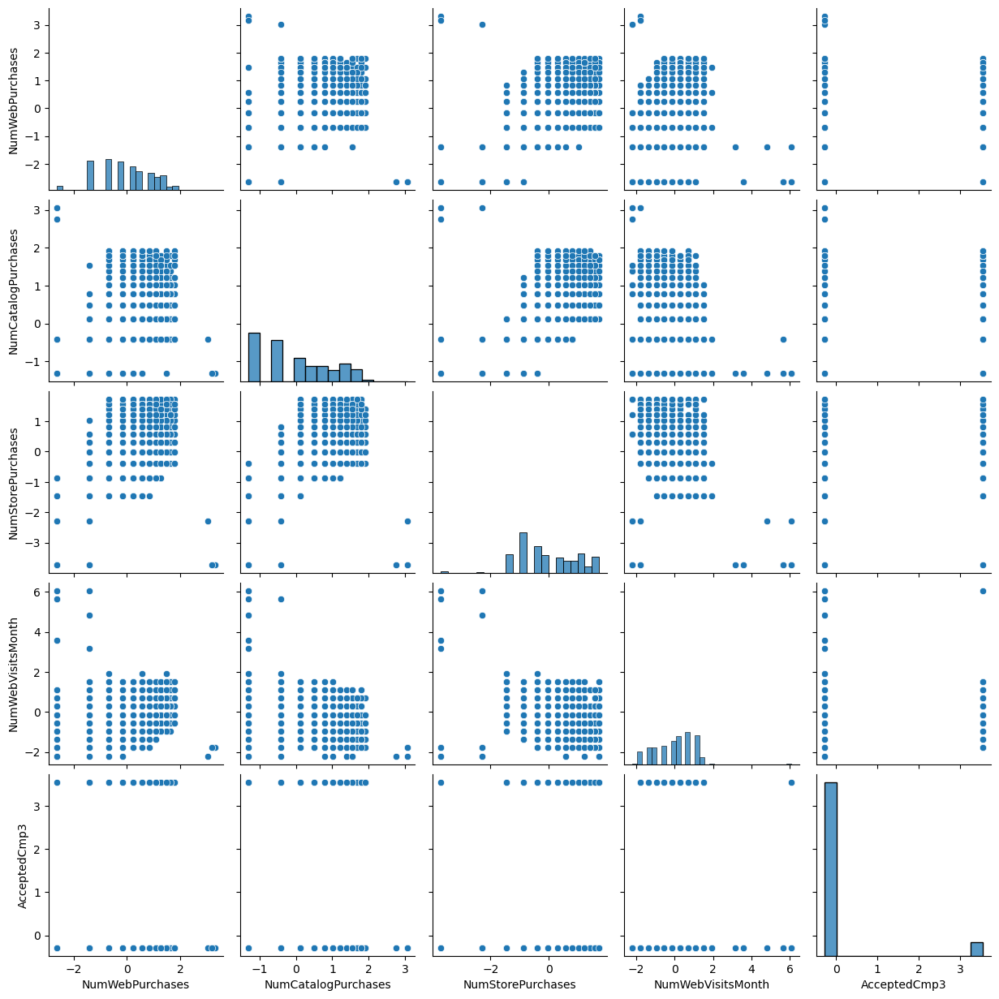

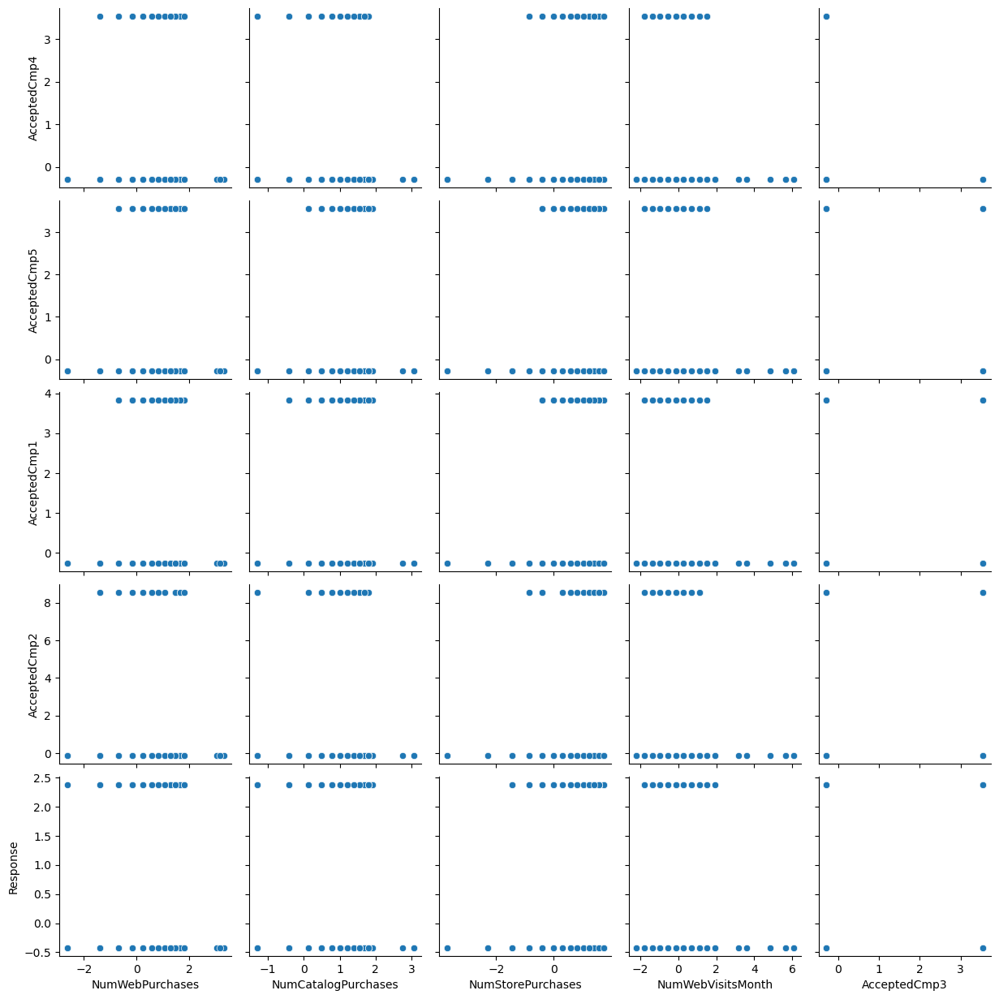

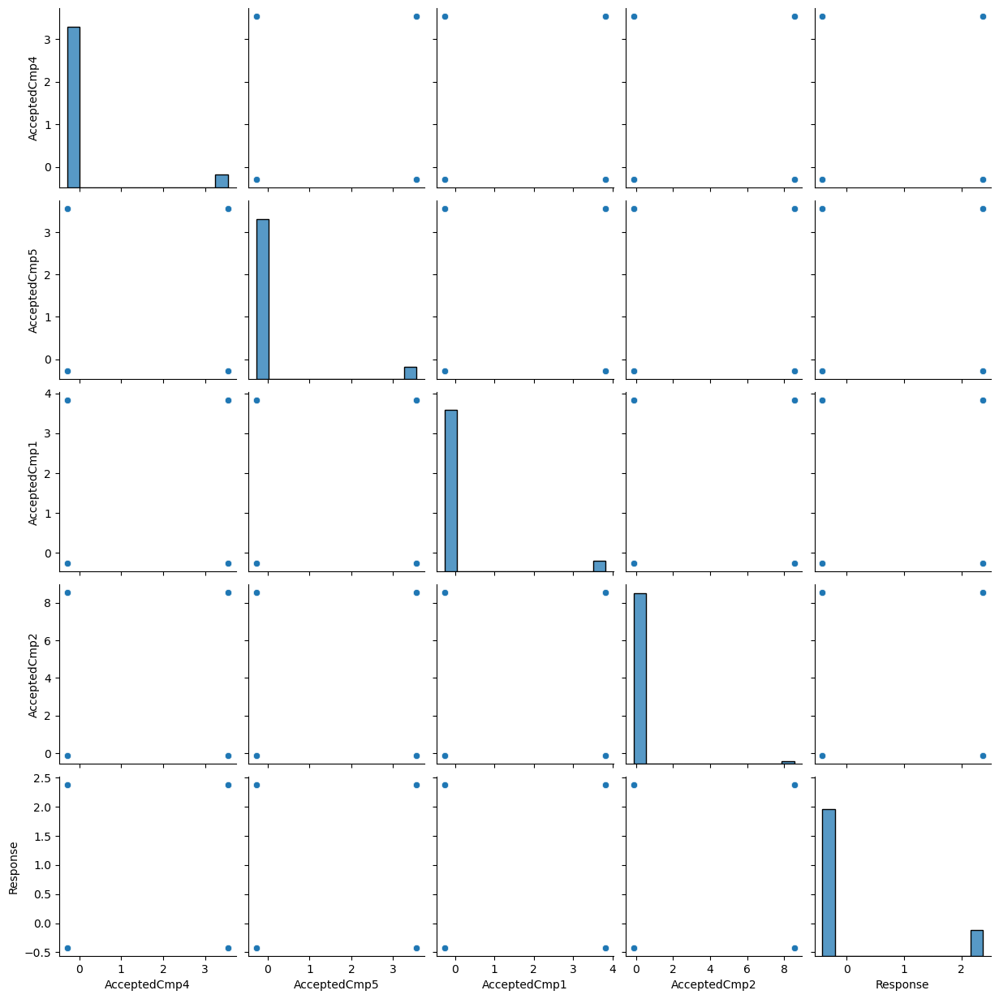

In [168]:
pairplot_labels = data.columns[data.columns != 'Complain']
for i in range(5):
    for j in range(i, 5):
        sns.pairplot(data, x_vars=pairplot_labels[i*5:i*5+5], y_vars=pairplot_labels[j*5:j*5+5])

Check the correlation of the data

In [21]:
corr_mat = data.corr()
for i in range(len(corr_mat.index)):
    corr_mat.iloc[i,i] = 0.0
    
corr_max = corr_mat.abs().idxmax()
pd.concat([corr_max, 
           pd.DataFrame([corr_mat.loc[label, corr_max[label]] for label in corr_max.index], index=corr_max.index)], 
           axis=1)

,0,0
Year_Birth,Teenhome,-0.350791
Education,MntWines,0.197468
Marital_Status,Year_Birth,-0.058229
Income,MntWines,0.786896
Kidhome,NumCatalogPurchases,-0.578451
Teenhome,NumDealsPurchases,0.445400
Dt_Customer,NumWebVisitsMonth,-0.255784
Recency,Response,-0.199766
MntWines,MntMeatProducts,0.827827
MntFruits,MntMeatProducts,0.704588


<Axes: >

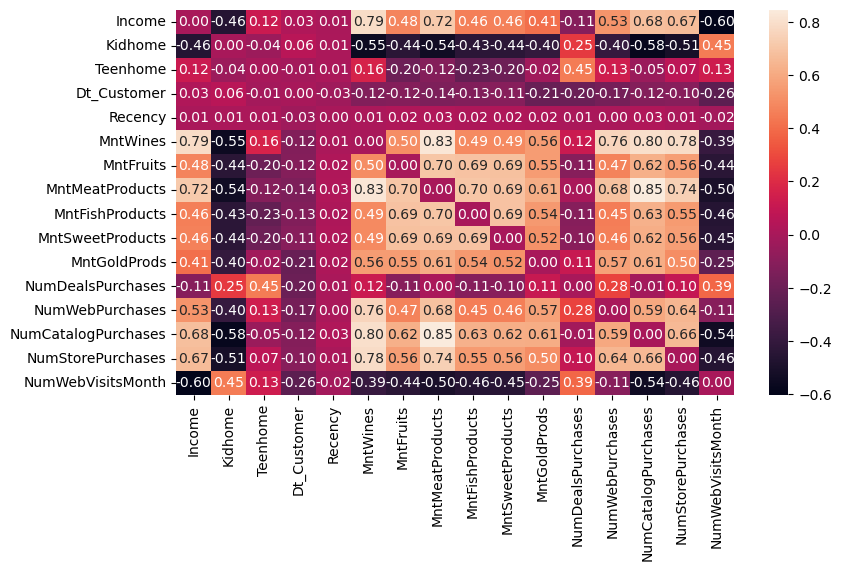

In [149]:
fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(1, 1, 1)
sns.heatmap(corr_mat.iloc[3:19, 3:19], annot=True, fmt='.2f')

## Dimensionalilty Reduction

In [23]:
# Perform PCA on data
from sklearn.decomposition import PCA

In [24]:
pca = PCA()
data_pca = data.copy()
data_pca = pca.fit_transform(data_pca)

In [25]:
np.cumsum(pca.explained_variance_ratio_)

array([0.29335982, 0.38018678, 0.45434524, 0.5218559 , 0.56789728,
       0.60768642, 0.64681942, 0.68494997, 0.72174351, 0.75534253,
       0.78694415, 0.81250856, 0.83591935, 0.85874163, 0.87888189,
       0.89761145, 0.91446624, 0.93035382, 0.94428549, 0.9560403 ,
       0.96767166, 0.97839275, 0.9861571 , 0.99295113, 0.99703368,
       1.        ])

In [26]:
data_pca = data_pca[:, :20]

## Clustering Models

In [169]:
# Helper function for displaying results
def show_classes(model):
    
    means = []
    size = []
    for cluster in np.unique(model.labels_):
#         print(f"Cluster {cluster}")
#         display(raw_data[model.labels_ == cluster].describe())
        means.append(raw_data[model.labels_ == cluster].describe().loc['mean'])
        size.append(np.sum(model.labels_ == cluster))
        
    means = pd.concat(means, axis=1, keys=range(len(means)))
    means.loc['ID'] = size
    means = means.rename(index={'ID': 'Size'})
    
    display(means)
    return means

In [115]:
results = {}

### K-means

In [116]:
from sklearn.cluster import KMeans

In [117]:
# Calculate inertia for different numbers of clusters
num_clusters = np.arange(2,11)
inertia_list = np.zeros(len(num_clusters))

for n in num_clusters:
    km = KMeans(n_clusters=n, random_state=rs)
    km_mdl = km.fit(data_pca)
    inertia_list[n-2] = km_mdl.inertia_

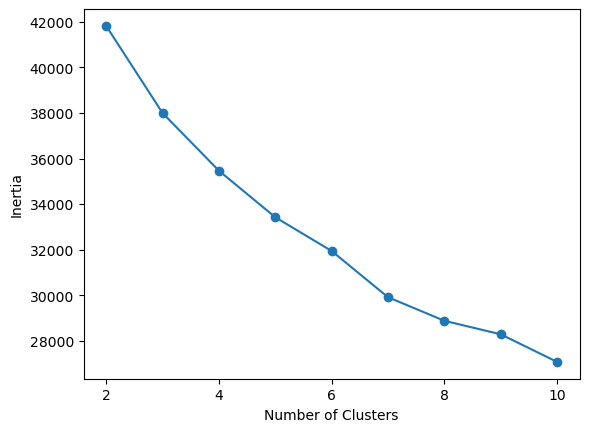

In [118]:
plt.plot(num_clusters, inertia_list, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.xticks(range(2,11,2))
plt.show()

In [218]:
km = KMeans(n_clusters=3, random_state=rs)
km = km.fit(data)
results['K Means'] = km.labels_

In [219]:
# n_clusters=3
kmeans3 = show_classes(km)

,0,1,2
Size,574.000000,879.000000,763.000000
Year_Birth,1968.405923,1972.015927,1965.450852
Income,75573.271777,33045.698521,56820.028834
Kidhome,0.033101,0.820250,0.313237
Teenhome,0.137631,0.422071,0.878113
Recency,49.557491,48.081911,49.674967
MntWines,607.440767,27.461889,397.474443
MntFruits,64.468641,3.804323,23.664482
MntMeatProducts,438.019164,19.788396,132.694626
MntFishProducts,96.958188,5.287827,30.279161


In [207]:
print(
kmeans3.T.loc[:, 
              ['NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 
               'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5']
             ].to_latex(float_format='%.2f')
)

\begin{tabular}{lrrrrrrrrr}
\toprule
{} &  NumDealsPurchases &  NumWebPurchases &  NumCatalogPurchases &  NumStorePurchases &  AcceptedCmp1 &  AcceptedCmp2 &  AcceptedCmp3 &  AcceptedCmp4 &  AcceptedCmp5 \\
\midrule
0 &               1.12 &             5.05 &                 5.80 &               8.33 &          0.21 &          0.04 &          0.09 &          0.14 &          0.27 \\
1 &               1.89 &             1.85 &                 0.45 &               2.94 &          0.00 &          0.00 &          0.07 &          0.01 &          0.00 \\
2 &               3.73 &             5.93 &                 2.87 &               7.19 &          0.02 &          0.01 &          0.07 &          0.10 &          0.01 \\
\bottomrule
\end{tabular}



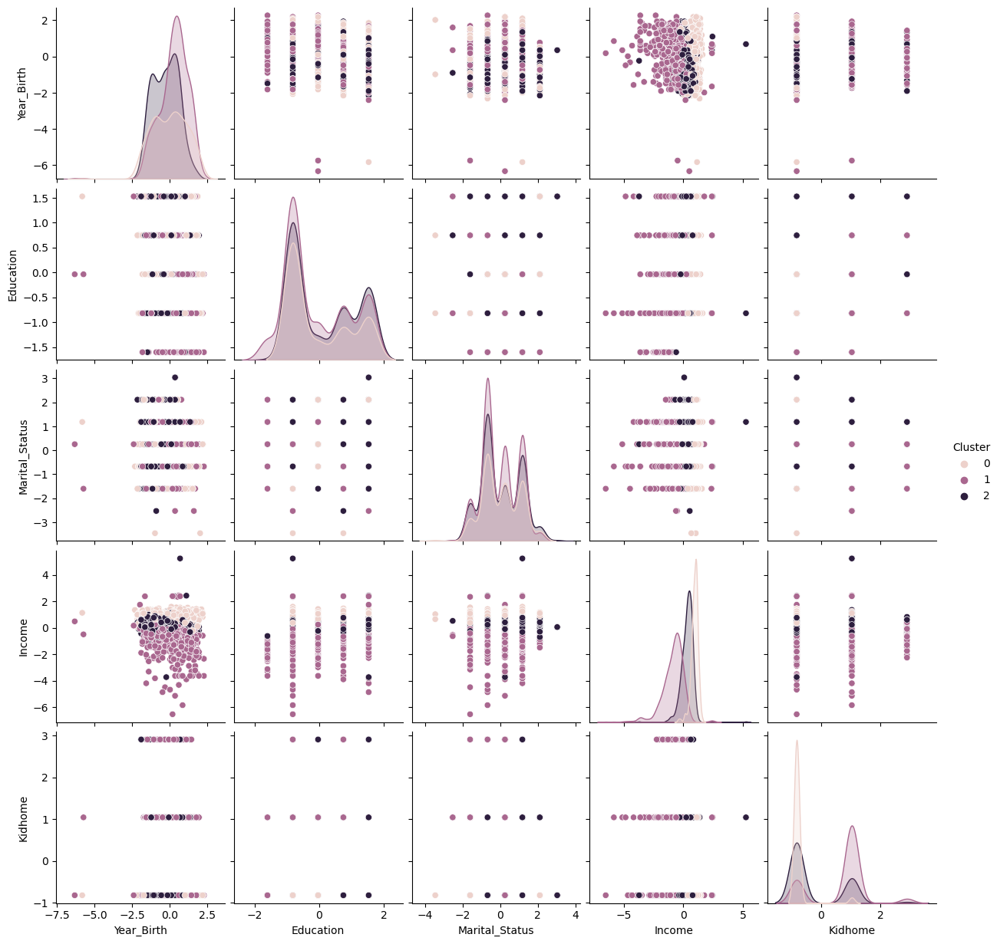

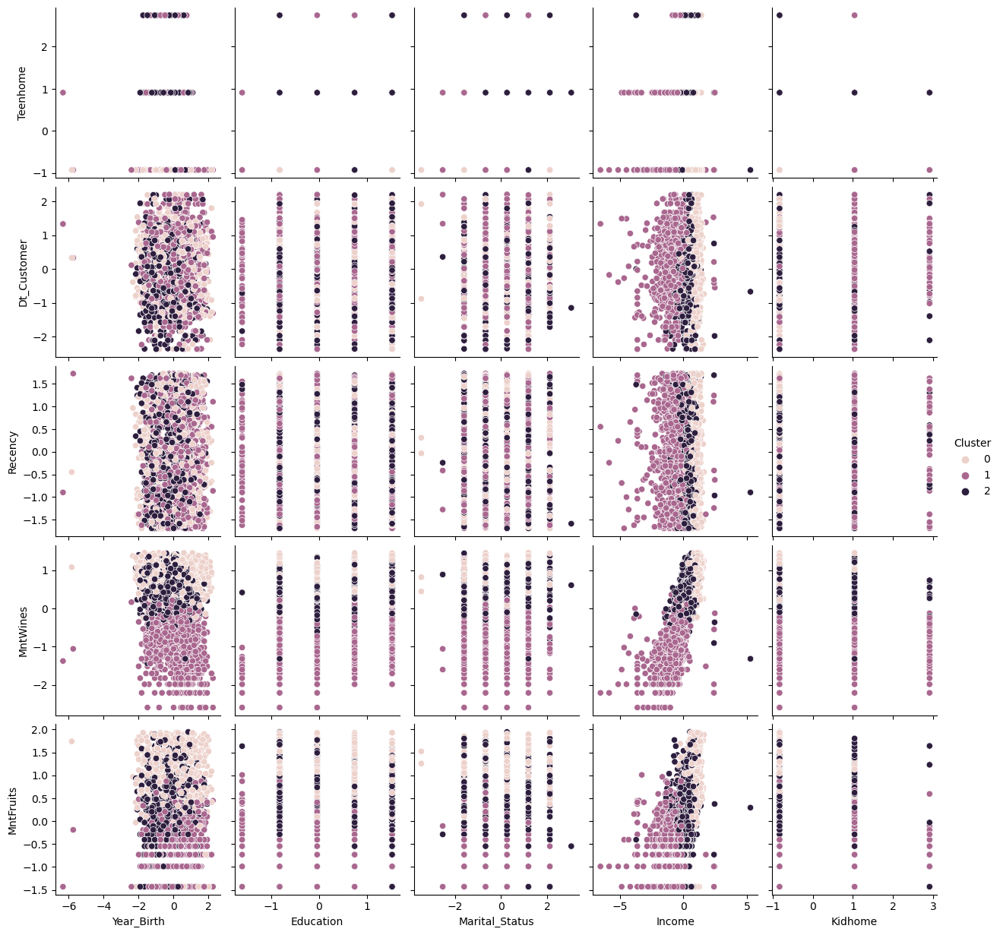

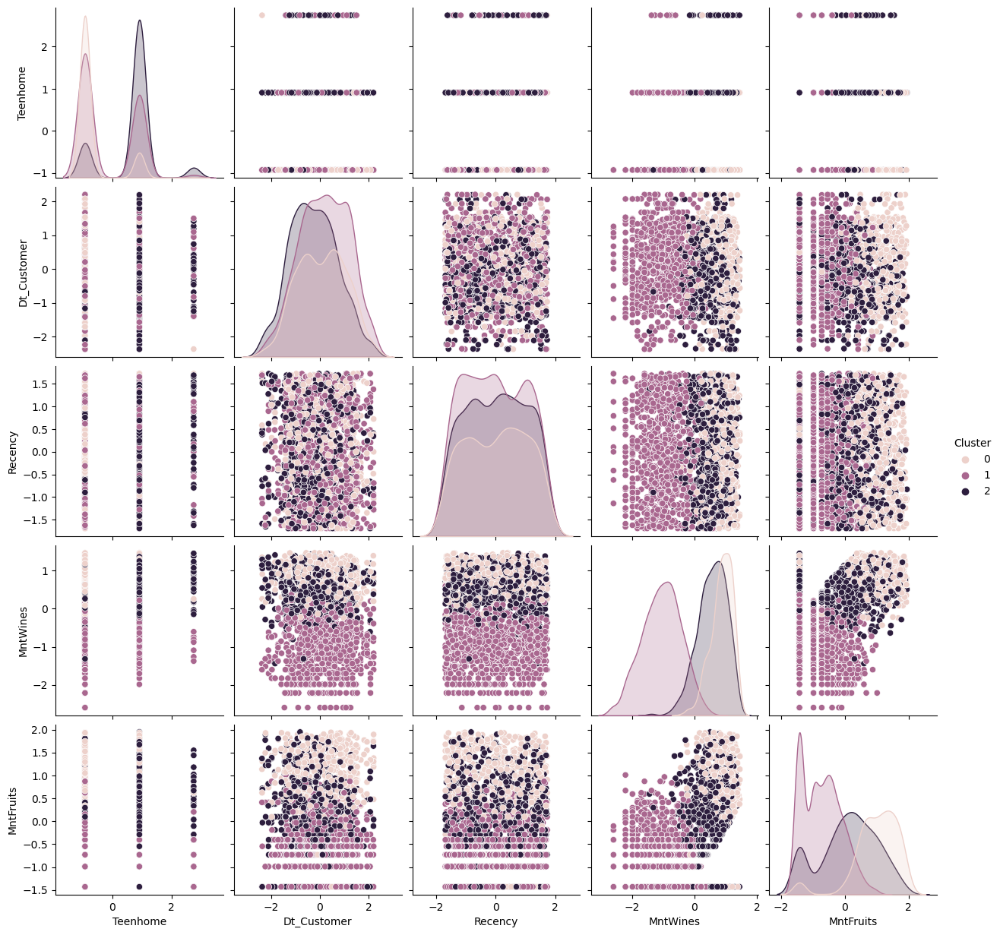

In [194]:
tmp_pd = pd.concat([data, pd.Series(km.labels_, name='Cluster', index=data.index)], axis=1)
for i in range(2):
    for j in range(i, 2):
        sns.pairplot(tmp_pd, x_vars=pairplot_labels[i*5:i*5+5], y_vars=pairplot_labels[j*5:j*5+5], hue='Cluster')

In [215]:
km = KMeans(n_clusters=3)
km = km.fit(data)
_ = show_classes(km)

,0,1,2
Size,574.000000,763.000000,879.000000
Year_Birth,1968.405923,1965.450852,1972.015927
Income,75573.271777,56820.028834,33045.698521
Kidhome,0.033101,0.313237,0.820250
Teenhome,0.137631,0.878113,0.422071
Recency,49.557491,49.674967,48.081911
MntWines,607.440767,397.474443,27.461889
MntFruits,64.468641,23.664482,3.804323
MntMeatProducts,438.019164,132.694626,19.788396
MntFishProducts,96.958188,30.279161,5.287827


### Hierarchical Agglomerate Clustering

In [83]:
from sklearn.cluster import AgglomerativeClustering

In [84]:
hac = AgglomerativeClustering(n_clusters=3)
hac_mdl = hac.fit(data)
results['Agglom'] = hac_mdl.labels_

In [220]:
hac_means = show_classes(hac_mdl)

,0,1,2
Size,535.000000,1057.000000,624.000000
Year_Birth,1967.985047,1970.997162,1965.849359
Income,74858.953271,36828.267739,58978.990385
Kidhome,0.044860,0.741722,0.274038
Teenhome,0.136449,0.462630,0.894231
Recency,48.371963,48.379376,50.634615
MntWines,620.781308,79.155156,417.144231
MntFruits,59.800000,7.094607,30.309295
MntMeatProducts,432.274766,37.844844,158.323718
MntFishProducts,89.485981,9.808893,40.323718


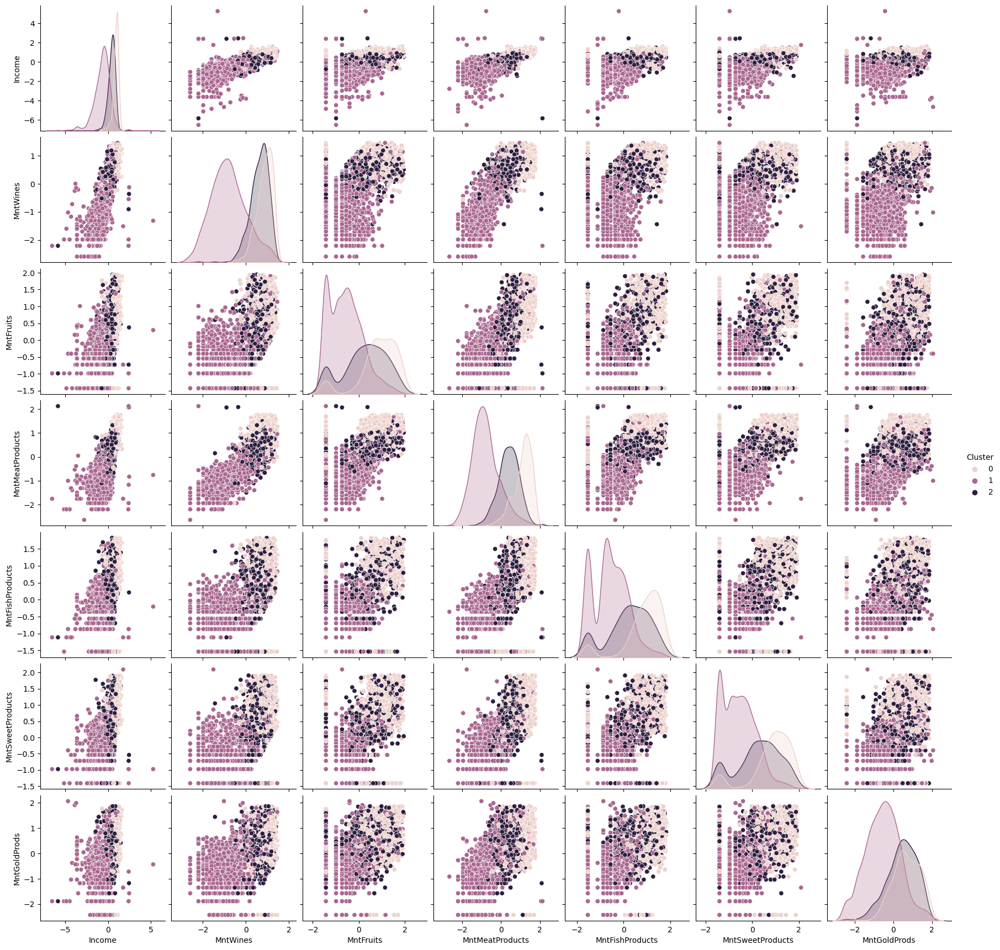

In [228]:
# tmp_pd = pd.concat([data, pd.Series(hac_mdl.labels_, name='Cluster', index=data.index)], axis=1)
# for i in range(2):
#     for j in range(i, 2):
#         sns.pairplot(tmp_pd, x_vars=pairplot_labels[i*5:i*5+5], y_vars=pairplot_labels[j*5:j*5+5], hue='Cluster')
tmp_pd = pd.concat([data.loc[:, ['Income', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']],
                    pd.Series(hac_mdl.labels_, name='Cluster', index=data.index)], axis=1)
sns.pairplot(tmp_pd, hue='Cluster')

### DBSCAN

In [41]:
from sklearn.cluster import DBSCAN

In [72]:
dbs = DBSCAN(eps=5.0, min_samples=3)
dbs_mdl = dbs.fit(data)
pd.DataFrame(dbs_mdl.labels_).value_counts().sort_index()

-1      38
 0    2143
 1      11
 2       8
 3       6
 4       7
 5       3
dtype: int64

In [53]:
np.any(dbs_mdl.labels_ == -1)

True

### Mean Shift 

In [86]:
from sklearn.cluster import MeanShift

ValueError: x and y must have same first dimension, but have shapes (10,) and (7,)

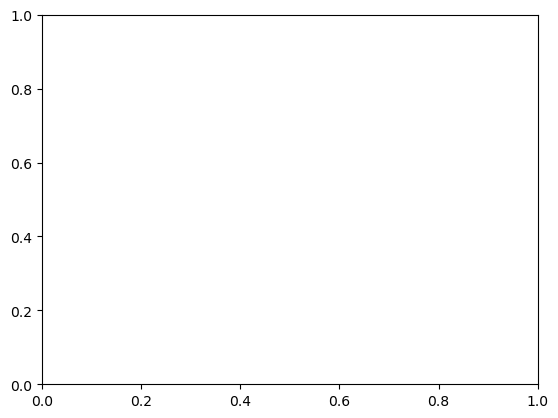

In [98]:
n_classes = []
for n in range(4,11):
    msc = MeanShift(bandwidth=n)
    msc_mdl = msc.fit(data)
    n_classes.append(len(np.unique(msc_mdl.labels_)))

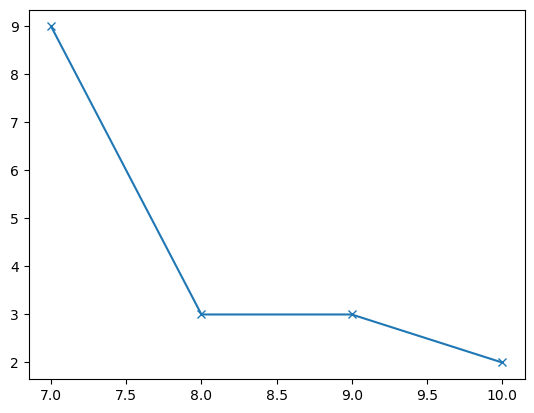

In [103]:
plt.plot(np.arange(7,11), n_classes[3:], marker="x")

In [106]:
msc = MeanShift(bandwidth=8)
msc_mdl = msc.fit(data_pca)
np.unique(msc_mdl.labels_)

array([0, 1, 2])

In [221]:
msc_means3 = show_classes(msc_mdl)

,0,1,2
Size,2165.000000,30.000000,21.000000
Year_Birth,1968.866051,1968.133333,1965.095238
Income,52054.584758,71054.833333,45242.285714
Kidhome,0.444804,0.066667,0.666667
Teenhome,0.506236,0.433333,0.523810
Recency,48.978291,48.666667,53.047619
MntWines,298.186605,898.666667,169.000000
MntFruits,26.424018,22.966667,24.190476
MntMeatProducts,166.370439,250.300000,112.476190
MntFishProducts,37.737644,38.733333,25.761905


In [216]:
results

{'K Means': array([0, 1, 0, ..., 0, 2, 2], dtype=int32)}

In [224]:
print(pd.concat([kmeans3, hac_means, msc_means3], axis=1, keys=['K-means', 'Agglomerate', 'Mean Shift']).to_latex(float_format='%.2f'))

\begin{tabular}{lrrrrrrrrr}
\toprule
{} & \multicolumn{3}{l}{K-means} & \multicolumn{3}{l}{Agglomerate} & \multicolumn{3}{l}{Mean Shift} \\
{} &        0 &        1 &        2 &           0 &        1 &        2 &          0 &        1 &        2 \\
\midrule
Size                &   574.00 &   879.00 &   763.00 &      535.00 &  1057.00 &   624.00 &    2165.00 &    30.00 &    21.00 \\
Year\_Birth          &  1968.41 &  1972.02 &  1965.45 &     1967.99 &  1971.00 &  1965.85 &    1968.87 &  1968.13 &  1965.10 \\
Income              & 75573.27 & 33045.70 & 56820.03 &    74858.95 & 36828.27 & 58978.99 &   52054.58 & 71054.83 & 45242.29 \\
Kidhome             &     0.03 &     0.82 &     0.31 &        0.04 &     0.74 &     0.27 &       0.44 &     0.07 &     0.67 \\
Teenhome            &     0.14 &     0.42 &     0.88 &        0.14 &     0.46 &     0.89 &       0.51 &     0.43 &     0.52 \\
Recency             &    49.56 &    48.08 &    49.67 &       48.37 &    48.38 &    50.63 &      48.98 &  